# Computer Simulations - Project 2. @ ELTE
# Complete velocity Verlet algorithm for Molecular Dynamics simulation in an enclosed box

In [8]:
import os
import sys
import random
import numpy as np
from numba import jit
from scipy import stats
from datetime import datetime

import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.patches import Circle
from mpl_toolkits.mplot3d import Axes3D
import mpl_toolkits.mplot3d.art3d as art3d

from IPython.display import display, clear_output

In [9]:
figsave_dir = '..\\Documentation\\Report\\src\\img_src\\'
figsave_format = 'pdf'
figsave_dpi = 200

# Set axtick dimensions
major_size = 6
major_width = 1.2
minor_size = 3
minor_width = 1
mpl.rcParams['xtick.major.size'] = major_size
mpl.rcParams['xtick.major.width'] = major_width
mpl.rcParams['xtick.minor.size'] = minor_size
mpl.rcParams['xtick.minor.width'] = minor_width
mpl.rcParams['ytick.major.size'] = major_size
mpl.rcParams['ytick.major.width'] = major_width
mpl.rcParams['ytick.minor.size'] = minor_size
mpl.rcParams['ytick.minor.width'] = minor_width

# Seaborn style settings
sns.set_style({'axes.axisbelow': True,
               'axes.edgecolor': '.8',
               'axes.facecolor': 'white',
               'axes.grid': True,
               'axes.labelcolor': '.15',
               'axes.spines.bottom': True,
               'axes.spines.left': True,
               'axes.spines.right': True,
               'axes.spines.top': True,
               'figure.facecolor': 'white',
               'font.family': ['sans-serif'],
               'font.sans-serif': ['Arial',
                'DejaVu Sans',
                'Liberation Sans',
                'Bitstream Vera Sans',
                'sans-serif'],
               'grid.color': '.8',
               'grid.linestyle': '--',
               'image.cmap': 'rocket',
               'lines.solid_capstyle': 'round',
               'patch.edgecolor': 'w',
               'patch.force_edgecolor': True,
               'text.color': '.15',
               'xtick.bottom': True,
               'xtick.color': '.15',
               'xtick.direction': 'in',
               'xtick.top': True,
               'ytick.color': '.15',
               'ytick.direction': 'in',
               'ytick.left': True,
               'ytick.right': True})

## Plotting Lennard-Jones potential

In [10]:
def lennard_jones(X, cut_off=None):

    V_0 = 1
    sigma = 1

    return 4 * V_0 * ((sigma/X)**12 - (sigma/X)**6)

In [11]:
X = np.linspace(0.6,5,1000)
Y = lennard_jones(X=X)

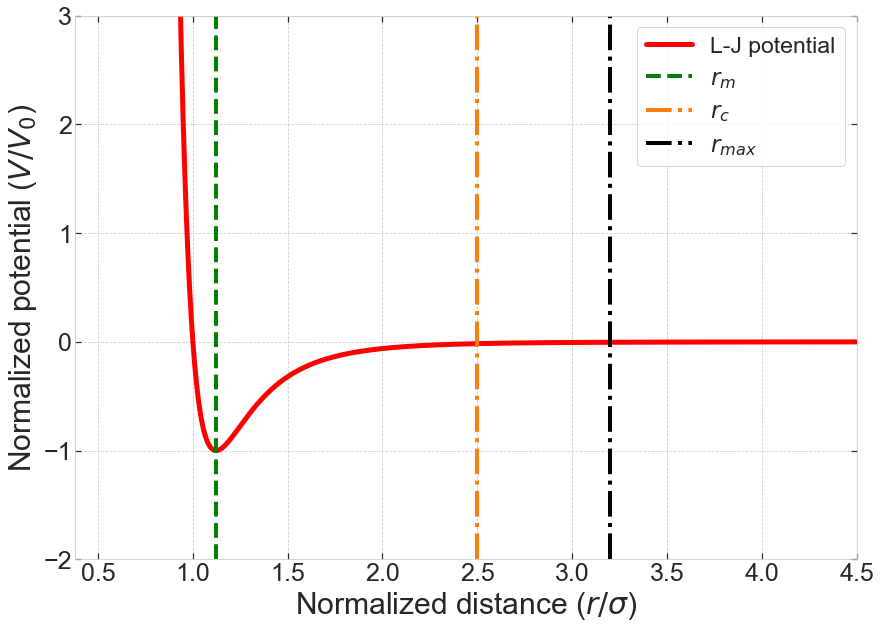

In [12]:
save = False
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(14,10))

axisticksize = 25
axislabelsize = 30
legendsize = 23

axes.plot(X, Y, color='red', lw=5, label='L-J potential')

axes.set_xlim(left=None, right=4.5)
axes.set_ylim(bottom=-2, top=3)
axes.set_xlabel('Normalized distance ($r/\sigma$)', fontsize=axislabelsize)
axes.set_ylabel('Normalized potential ($V/V_{0}$)', fontsize=axislabelsize)
axes.tick_params(axis='both', which='major', labelsize=axisticksize)

axes.axvline(x=2**(1/6), ymin=0, ymax=1, ls='--', lw=4, color='green', label='$r_{m}$')
axes.axvline(x=2.5, ymin=0, ymax=1, ls='-.', lw=4, color='tab:orange', label='$r_{c}$')
axes.axvline(x=3.2, ymin=0, ymax=1, ls='-.', lw=4, color='k', label=r'$r_{max}$')

plt.legend(loc='upper right', fontsize=legendsize)

if save:
    plt.savefig(figsave_dir +
                'Lennard_Jones_Potential.' + figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')
if save:
    plt.savefig('..\\Documentation\\Concept\\src\\img_src\\' +
                'Lennard_Jones_Potential.' + figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

## Prefixing parameters and constants

In [128]:
def initial_parameters():
    # Number of particles
    N = 864
    # Number of pairs
    n_pairs = int(N * (N - 1) / 2)
    # Tempreature
    T = 50
    # Side length of box
    L = None
    # Mean density of particles
    rho = 1.2
    # Time step length
    dt = 1e-3

    # Cut-off limit of Lennard-Jones Potential
    r_c = 2.5
    # Maximal size of pair-list
    r_max = 3.2
    # Update interval of updating the pair-list
    update_interval = 10

    # In the short description it is discussed, that
    # it is adviced to choose some physical quantities to 1
    # as it makes the calculations easier.
    m = 1
    V_0 = 1
    sigma = 1

    # Boundary conditions for the simulation
    # boundary = ['periodic' | 'bounded']
    boundary = 'periodic'

    # Natural constants
    # However calculating velocities, we set k_B to 1
    k_B = 1.38e-23    # Boltzmann constant [J/K]
    N_A = 6.022e23    # Avogadro's number [1/mol]
    
    return N, n_pairs, T, L, rho, dt, r_c, r_max, update_interval,\
           m, V_0, sigma, boundary, k_B, N_A

### Auxiliary functions

In [129]:
@jit(nopython=True)
def sign_choose():
    return -1 if np.random.random() > 0.5 else 1

In [130]:
@jit(nopython=True)
def instantaneous_temperature(v):
    vSqd = 0
    for i in range(N):
        for k in range(3):
            vSqd += v[i][k]**2
    return vSqd / (3 * (N - 1))

In [131]:
@jit(nopython=True)
def instantaneous_kinetic_E(v):
    vSqd = 0
    for i in range(N):
        for k in range(3):
            vSqd += v[i][k]**2
    
    return 1/2 * m * vSqd    

### Calculate the initial condition

In [132]:
def initialize():

    r = init_positions()
    v = init_velocities()
    
    pair_list = np.zeros((n_pairs,2), dtype='int')
    dr_pair = np.zeros((n_pairs,3))
    dr_sqd_pair = np.zeros(n_pairs)

    pair_list, n_pairs_init = update_pair_list(r, pair_list)
    dr_pair, dr_sqd_pair = update_pair_separations(r, pair_list, dr_pair, dr_sqd_pair)
    
    kinetic_E = instantaneous_kinetic_E(v)
    a, potential_E = compute_accelerations(pair_list, dr_pair, dr_sqd_pair)

    return r, v, a, pair_list, n_pairs_init, dr_pair, dr_sqd_pair, kinetic_E, potential_E

In [133]:
@jit(nopython=True)
def init_lattice_params(N, L, rho):
    
    if L is None and rho is None:
        raise AttributeError('Either \'rho\' or \'L\' should be given!')
    # Compute side of cube (L) from number of particles (N) and number density (rho)
    if L is None and rho is not None:
        L = (N / rho)**(1/3)
    # If L is given always use its value instead of rho
    elif L is not None and rho is None:
        rho = N / L**3
    else:
        rho = N / L**3

    # Find M large enough to fit N atoms on an fcc lattice
    M = 1
    while 4 * M**3 < N:
        M += 1

    # Lattice constant of conventional cell
    a_latt = L / M
    
    return L, rho, M, a_latt

### Updating pair-list

In [145]:
@jit(nopython=True)
def compute_separation(r, i, j):
    # Find separation using closest image convention
    dr = r[i] - r[j]
    if boundary == 'periodic':
        # Closest image convention
        if dr[k] >= 0.5*L:
            dr[k] -= L
        if dr[k] < -0.5*L:
            dr[k] += L
    dr_sqd = np.sum(dr**2)
    return dr, dr_sqd

In [135]:
@jit(nopython=True)
def update_pair_list(r, pair_list):
    n_pairs = 0
    for i in range(N-1):
        for j in range(i+1, N):
            dr, dr_sqd = compute_separation(r, i, j)
            if dr_sqd < r_max**2:
                pair_list[n_pairs][0] = i
                pair_list[n_pairs][1] = j
                n_pairs += 1
    return pair_list, n_pairs

In [136]:
@jit(nopython=True)
def update_pair_separations(r, pair_list, dr_pair, dr_sqd_pair):
    for p in range(n_pairs):
        i = pair_list[p][0]
        j = pair_list[p][1]
        dr, dr_sqd = compute_separation(r, i, j)
        for d in range(3):
            dr_pair[p][d] = dr[d]
        dr_sqd_pair[p] = dr_sqd
        
    return dr_pair, dr_sqd_pair

### Calculating $\vec{r}$, $\vec{v}$ and $\vec{a}$ with corrections

In [137]:
@jit(nopython=True)
def init_positions():
    
    r = np.zeros((N,3))

    # 4 atomic positions in fcc unit cell 
    xCell = np.array((0.25, 0.75, 0.75, 0.25))
    yCell = np.array((0.25, 0.75, 0.25, 0.75))
    zCell = np.array((0.25, 0.25, 0.75, 0.75))

    # Atoms placed so far
    n = 0
    for x in range(M):
        for y in range(M):
            for z in range(M):
                for k in range(4):
                    if (n < N):
                        r[n][0] = (x + xCell[k]) * a_latt
                        r[n][1] = (y + yCell[k]) * a_latt
                        r[n][2] = (z + zCell[k]) * a_latt
                        n += 1
    return r

In [138]:
@jit(nopython=True)
def gasdev():
    available = False
    if available is False:
        while True:
            # Pick two uniform numbers in the square extending from -1 to +1 in each direction
            v1 = np.random.random() * sign_choose()
            v2 = np.random.random() * sign_choose()
            # See if they are inside the unit circle
            rsq = v1**2 + v2**2
            # If they are not, try again
            if rsq >= 1 or rsq == 0:
                continue
            else:
                break
        # Now make the Box-Müller transformation to get two normal deviates.
        # Return one and save the other for next time.
        fac = np.sqrt(-2 * np.log(rsq) / rsq)
        gset = v1 * fac
        available = True
        return v2 * fac
    else:
        available = False
        return gset

In [139]:
@jit(nopython=True)
def rescale_velocities(v):
    v_sqd_sum = 0
    for n in range(N):
        v_sqd_sum += np.sum(v[n]**2)
    lmbda = np.sqrt(3 * (N-1) * T / v_sqd_sum)
    v *= lmbda

    return v

In [140]:
@jit(nopython=True)
def init_velocities():
    
    v = np.zeros((N,3))
    
    # Gaussian with unit variance
    for n in range(N):
        for i in range(3):
            v[n][i] = gasdev()
    
    # Calculate velocity of CM
    # v_CM = sum_i v_i / N
    v_CM = np.zeros(3)
    for n in range(N):
        v_CM += v[n]
    v_CM /= N

    # Substract from velocities
    for n in range(N):
        v[n] -= v_CM

    # Rescale velocities to get the desired instantaneous temperature
    v = rescale_velocities(v)
    
    return v

In [141]:
@jit(nopython=True)
def compute_accelerations(pair_list, dr_pair, dr_sqd_pair):

    # Potential energy
    potential_E = 0

    # All accelerations at the start of the step are set to 0
    a = np.zeros((N,3))

    for p in range(n_pairs):
        i = pair_list[p][0]
        j = pair_list[p][1]
        if dr_sqd_pair[p] < r_c**2:
            # rx_inv = 1/r^x
            r2_inv = 1 / dr_sqd_pair[p]
            r6_inv = r2_inv**3
            r12_inv = r6_inv**2
            # Force between the particles with indeces 'i' and 'j'
            # F = 24 * V_0 * r2_inv * (2 * sigma^12 * r12_inv - sigma^6 * r6_inv) * |r|
            F_wo_r = 24 * V_0 * r2_inv * (2 * sigma**12 * r12_inv - sigma**6 * r6_inv)

            # Calculate accelerations of interacting particles
            # a = F/m
            # Since m = 1, we can write a = F
            for d in range(3):
                F = F_wo_r * dr_pair[p][d]
                a[i][d] += F
                a[j][d] -= F

            # Step with potential energy
            # V = 4 * V_0 * (sigma^12 * r12_inv - sigma^6 * r6_inv)
            potential_E += 4 * V_0 * (sigma**12 * r12_inv - sigma**6 * r6_inv)

    return a, potential_E

### Velocity Verlet integration

In [142]:
@jit(nopython=True)
def velocity_verlet(r, v, a, pair_list, dr_pair, dr_sqd_pair):

    # Verlet stepping rule for coordinates:
    # r_(n+1) = r_(n) + dt * v_(n) + 1/2 * dt^2 * a_(n)
    for i in range(N):
        for k in range(3):
            r[i][k] += dt * v[i][k] + 0.5 * dt**2 * a[i][k]

            if(boundary == 'periodic'):
                # Use periodic boundary conditions
                if (r[i][k] < 0):
                    r[i][k] += L
                if (r[i][k] >= L):
                    r[i][k] -= L

            # Verlet stepping rule for velocity
            # v_(n+1) = v_(n) + 1/2 * dt * a_(n+1) + {{1/2 * dt * a_(n)}}
            # First step with the {{a_(n)}} part
            v[i][k] += 0.5 * dt * a[i][k]
    
    # Calculate a_(n+1)
    dr_pair, dr_sqd_pair = update_pair_separations(r, pair_list, dr_pair, dr_sqd_pair)
    a, potential_E = compute_accelerations(pair_list, dr_pair, dr_sqd_pair)

    for i in range(N):
        for k in range(3):
            if(boundary == 'bounded'):
                # use bounded boundary conditions
                if (r[i][k] < 0 or r[i][k] >= L):
                    v[i][k] *= -1
                    a[i][k] *= -1

            # Verlet stepping rule for velocity
            # v_(n+1) = v_(n) + {{1/2 * dt * a_(n+1)}} + 1/2 * dt * a_(n)
            # Now add the {{a_(n+1)}} part
            v[i][k] += 0.5 * dt * a[i][k]

    kinetic_E = instantaneous_kinetic_E(v)

    return r, v, a, pair_list, dr_pair, dr_sqd_pair, kinetic_E, potential_E

### Run the simulation

In [143]:
# Number of simulated steps
n_steps = 2000

# Initial parameters
N, n_pairs, T, L, rho, dt, r_c, r_max, update_interval,\
                     m, V_0, sigma, boundary, k_B, N_A = initial_parameters()
L, rho, M, a_latt = init_lattice_params(N, L, rho)

# ---------- HISTORICAL PARAMETERS ----------
r_history = np.zeros((n_steps+1, N, 3))
v_history = np.zeros((n_steps+1, N, 3))
a_history = np.zeros((n_steps+1, N, 3))
kinetic_E_history = np.zeros(n_steps+1)
potential_E_history = np.zeros(n_steps+1)
temperature_history = np.zeros(n_steps+1)

# ---------- INITIALIZATION ----------
# Starting values
r, v, a, pair_list, n_pairs, dr_pair, dr_sqd_pair,\
                  kinetic_E, potential_E = initialize()

r_history[0] = r
v_history[0] = v
a_history[0] = a
kinetic_E_history[0] = kinetic_E
potential_E_history[0] = potential_E
temperature_history[0] = instantaneous_temperature(v)

# ---------- STEPPING THE SIMULATION ----------
for i in range(n_steps):

    r, v, a, pair_list, dr_pair, dr_sqd_pair, kinetic_E, potential_E =\
    velocity_verlet(r, v, a, pair_list, dr_pair, dr_sqd_pair)
    
    if i % 200 == 0:
        v = rescale_velocities(v)
        clear_output(wait=True)
        print('Current run: {0}/{1}'.format(i, n_steps))
    if i % update_interval == 0:
        pair_list, n_pairs = update_pair_list(r, pair_list)
        dr_pair, dr_sqd_pair = update_pair_separations(r, pair_list, dr_pair, dr_sqd_pair)

    r_history[i+1] = r
    v_history[i+1] = v
    a_history[i+1] = a
    kinetic_E_history[i+1] = kinetic_E
    potential_E_history[i+1] = potential_E
    temperature_history[i+1] = instantaneous_temperature(v)

clear_output()
print('Finished!')

ZeroDivisionError: division by zero

In [147]:
r = init_positions()
pair_list = np.zeros((n_pairs,2), dtype='int')
dr_pair = np.zeros((n_pairs,3))
dr_sqd_pair = np.zeros(n_pairs)

pair_list, n_pairs_init = update_pair_list(r, pair_list)
dr_pair, dr_sqd_pair = update_pair_separations(r, pair_list, dr_pair, dr_sqd_pair)

In [151]:
dr_pair

array([[-0.74690079, -0.74690079,  0.        ],
       [-0.74690079,  0.        , -0.74690079],
       [ 0.        , -0.74690079, -0.74690079],
       ...,
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ]])

In [152]:
pair_list

array([[0, 1],
       [0, 2],
       [0, 3],
       ...,
       [0, 0],
       [0, 0],
       [0, 0]])

## Plot out data
### Instantaneous energy

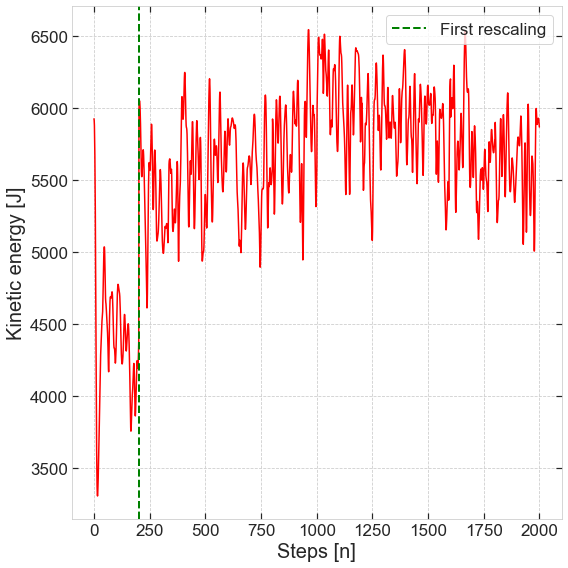

In [119]:
save = False
nrows=1
ncols=1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*8,nrows*8))

titlesize = 23
axislabelsize = 20

axes.plot(np.arange(n_steps+1), kinetic_E_history, color='red')

axes.axvline(x=200, linewidth=2, linestyle='--',  color='green', label='First rescaling')
#axes.axvline(x=equlibrium, linewidth=2, linestyle='--',  color='black', label='Equilibrium')
axes.set_xlabel('Steps [n]', fontsize=axislabelsize)
axes.set_ylabel('Kinetic energy [J]', fontsize=axislabelsize)
axes.tick_params(axis='both', which='major', labelsize=axislabelsize-3)
axes.yaxis.get_offset_text().set_size(15)
axes.legend(loc='upper right', fontsize=17)

fig.tight_layout()
if save:
    plt.savefig(figsave_dir +
                'instantaneous_kinetic_E_' + str(int(n/1000)) + '.' +
                figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

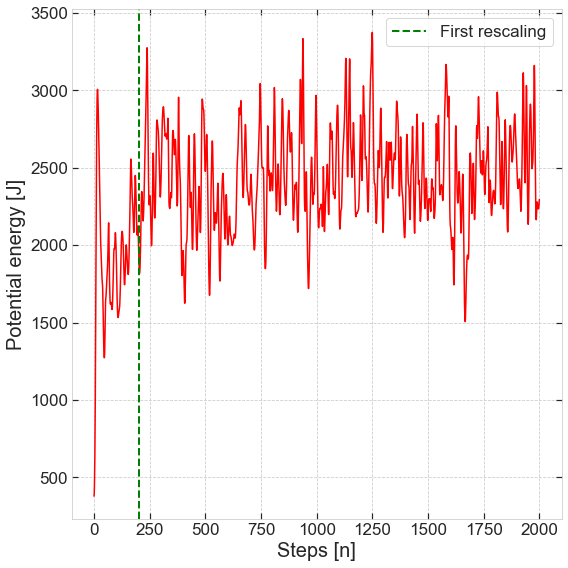

In [120]:
save = False
nrows=1
ncols=1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*8,nrows*8))

titlesize = 23
axislabelsize = 20

axes.plot(np.arange(n_steps+1), potential_E_history, color='red')

axes.axvline(x=200, linewidth=2, linestyle='--',  color='green', label='First rescaling')
#axes.axvline(x=equlibrium, linewidth=2, linestyle='--',  color='black', label='Equilibrium')
axes.set_xlabel('Steps [n]', fontsize=axislabelsize)
axes.set_ylabel('Potential energy [J]', fontsize=axislabelsize)
axes.tick_params(axis='both', which='major', labelsize=axislabelsize-3)
axes.yaxis.get_offset_text().set_size(15)
axes.legend(loc='upper right', fontsize=17)

fig.tight_layout()
if save:
    plt.savefig(figsave_dir +
                'instantaneous_potential_E_' + str(int(n/1000)) + '.' +
                figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

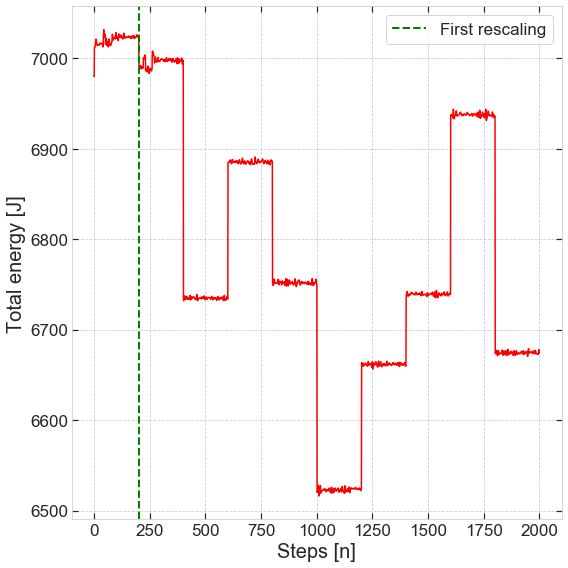

In [84]:
save = False
nrows=1
ncols=1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*8,nrows*8))

titlesize = 23
axislabelsize = 20

axes.plot(np.arange(n_steps+1), kinetic_E_history+potential_E_history, color='red')

axes.axvline(x=200, linewidth=2, linestyle='--',  color='green', label='First rescaling')
#axes.axvline(x=equlibrium, linewidth=2, linestyle='--',  color='black', label='Equilibrium')
axes.set_xlabel('Steps [n]', fontsize=axislabelsize)
axes.set_ylabel('Total energy [J]', fontsize=axislabelsize)
axes.tick_params(axis='both', which='major', labelsize=axislabelsize-3)
axes.yaxis.get_offset_text().set_size(15)
axes.legend(loc='upper right', fontsize=17)

fig.tight_layout()
if save:
    plt.savefig(figsave_dir +
                'instantaneous_total_E_' + str(int(n/1000)) + '.' +
                figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

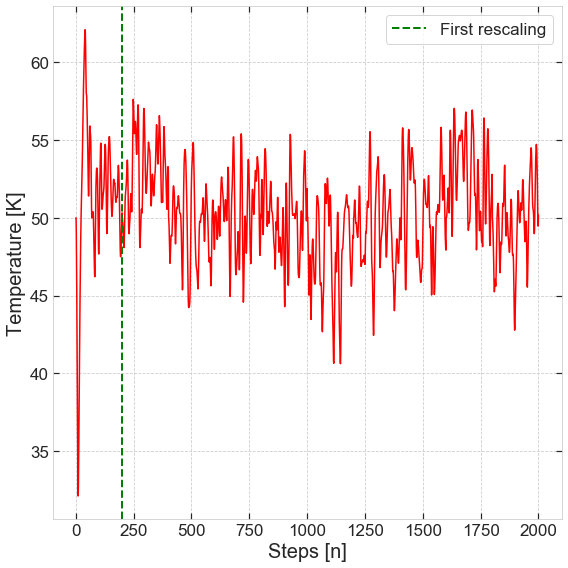

In [85]:
save = False
nrows=1
ncols=1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*8,nrows*8))

titlesize = 23
axislabelsize = 20

axes.plot(np.arange(n_steps+1), temperature_history, color='red')

axes.axvline(x=200, linewidth=2, linestyle='--',  color='green', label='First rescaling')
#axes.axvline(x=equlibrium, linewidth=2, linestyle='--',  color='black', label='Equilibrium')
axes.set_xlabel('Steps [n]', fontsize=axislabelsize)
axes.set_ylabel('Temperature [K]', fontsize=axislabelsize)
axes.tick_params(axis='both', which='major', labelsize=axislabelsize-3)
axes.yaxis.get_offset_text().set_size(15)
axes.legend(loc='upper right', fontsize=17)

fig.tight_layout()
if save:
    plt.savefig(figsave_dir +
                'instantaneous_temperatures_' + str(int(n/1000)) + '.' +
                figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

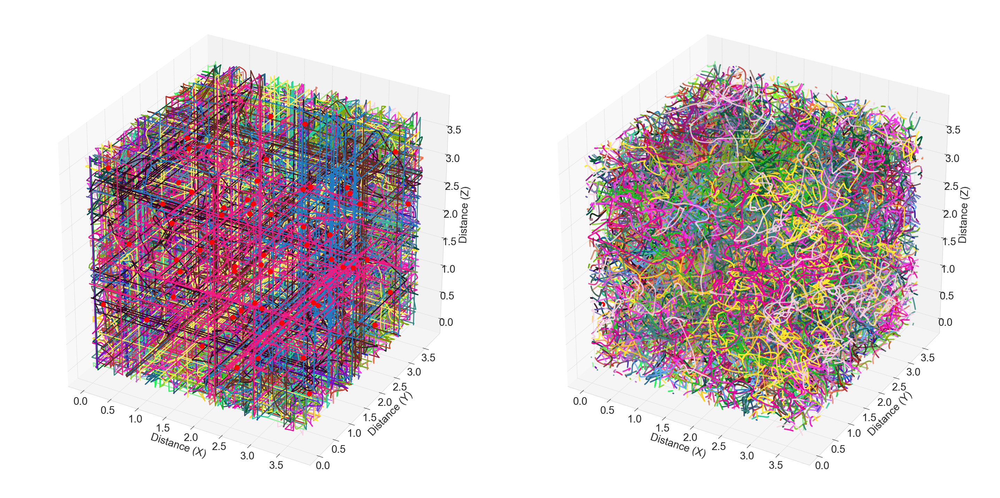

In [60]:
save = True

nrows=1
ncols=2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*20),
                         subplot_kw={'projection': '3d'})

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('Distance (X)', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_ylabel('Distance (Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_zlabel('Distance (Z)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_xlabel('Distance (X)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_ylabel('Distance (Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_zlabel('Distance (Z)', fontsize=axislabelsize, labelpad=labelpad)

axes[0].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[1].tick_params(axis='both', which='major', labelsize=axislabelsize)

lim_min = None
lim_max = None
steps = 1
for n in range(N):
    color = np.array([random.random(), random.random(), random.random()])
    axes[0].plot(r_history[lim_min:lim_max:steps,n,0],
                 r_history[lim_min:lim_max:steps,n,1],
                 r_history[lim_min:lim_max:steps,n,2],
                 color=color, lw=3)
    
    axes[0].scatter(r_history[lim_min:lim_max:steps,n,0][-1],
                    r_history[lim_min:lim_max:steps,n,1][-1],
                    r_history[lim_min:lim_max:steps,n,2][-1],
                    color='red', s=200)

    axes[1].scatter(r_history[lim_min:lim_max:steps,n,0],
                    r_history[lim_min:lim_max:steps,n,1],
                    r_history[lim_min:lim_max:steps,n,2],
                    color=color, s=10)

    axes[1].scatter(r_history[lim_min:lim_max:steps,n,0][-1],
                    r_history[lim_min:lim_max:steps,n,1][-1],
                    r_history[lim_min:lim_max:steps,n,2][-1],
                    color='red', s=200)

fig.tight_layout()
if save:
    '''plt.savefig(figsave_dir +
                'md3_trajectories_compare' + '.' +
                figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')'''
    
    plt.savefig(figsave_dir +
                'md3_trajectories_compare' + '.' +
                'png',
                format='png',
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

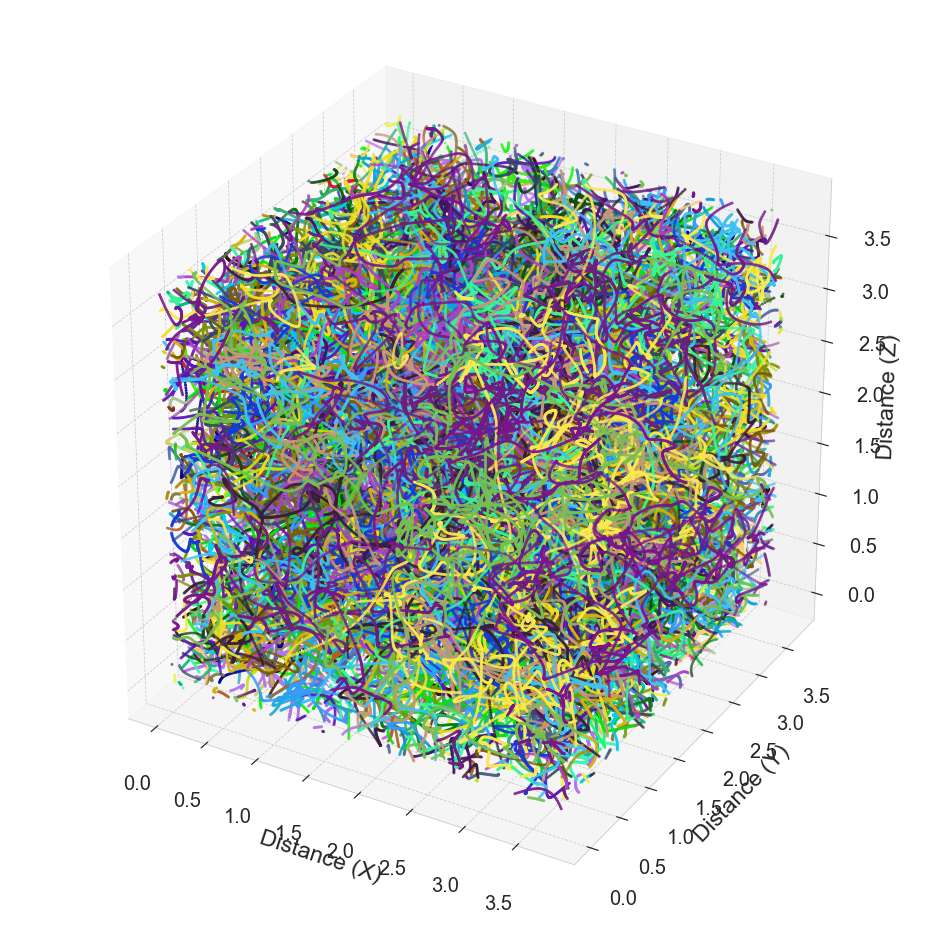

In [74]:
save = True

nrows=1
ncols=1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*13,nrows*13),
                         subplot_kw={'projection': '3d'})

axislabelsize = 23
axisticksize = 20
labelpad = 25
scattersize = 2

axes.set_xlabel('Distance (X)', fontsize=axislabelsize, labelpad=labelpad)
axes.set_ylabel('Distance (Y)', fontsize=axislabelsize, labelpad=labelpad)
axes.set_zlabel('Distance (Z)', fontsize=axislabelsize, labelpad=labelpad)

axes.tick_params(axis='both', which='major',
                 pad=labelpad, labelsize=axisticksize)
axes.tick_params(axis='both', which='major',
                 pad=labelpad, labelsize=axisticksize)

lim_min = None
lim_max = None
steps = 1

start = 0.2
stop = 1.0
cm_subsection = np.linspace(start, stop, N) 
colors = [cm.nipy_spectral(i) for i in cm_subsection]

for n in range(N):
    color = np.array([random.random(), random.random(), random.random()])
    axes.scatter(r_history[lim_min:lim_max:steps,n,0],
                 r_history[lim_min:lim_max:steps,n,1],
                 r_history[lim_min:lim_max:steps,n,2],
                 color=color, s=scattersize**2)

fig.tight_layout()
if save:
    '''plt.savefig(figsave_dir +
                'md3_trajectories_compare' + '.' +
                figsave_format,
                format=figsave_format,
                dpi=figsave_dpi,
                bbox_inches='tight')'''
    
    plt.savefig(figsave_dir +
                'md3_trajectories_scatter' + '.' +
                'png',
                format='png',
                dpi=figsave_dpi,
                bbox_inches='tight')
plt.show()

## Calculations for $<E>$, $<E^2>$, $C_V$, $Z$

In [134]:
E_expected_1 = np.mean(Energy_1[equlibrium::])
E_expected_2 = np.mean(Energy_2[equlibrium::])
E_expected_3 = np.mean(Energy_3[equlibrium::])

E_expected_squared_1 = E_expected_1**2
E_expected_squared_2 = E_expected_2**2
E_expected_squared_3 = E_expected_3**2

E2_expected_1 = np.mean(np.square(Energy_1[equlibrium::]))
E2_expected_2 = np.mean(np.square(Energy_2[equlibrium::]))
E2_expected_3 = np.mean(np.square(Energy_3[equlibrium::]))

E_oscillation_1 = E2_expected_1 - E_expected_squared_1
E_oscillation_2 = E2_expected_2 - E_expected_squared_2
E_oscillation_3 = E2_expected_3 - E_expected_squared_3

print('Expected value for first simulation: {0}'.format(E_expected_1))
print('Expected value for second simulation: {0}'.format(E_expected_2))
print('Expected value for third simulation: {0}'.format(E_expected_3))
print('\n')
print('Square of expected value for first simulation: {0}'.format(E_expected_squared_1))
print('Square of expected value for second simulation: {0}'.format(E_expected_squared_2))
print('Square of expected value for third simulation: {0}'.format(E_expected_squared_3))
print('\n')
print('Expected value for first simulation: {0}'.format(E2_expected_1))
print('Expected value for second simulation: {0}'.format(E2_expected_2))
print('Expected value for third simulation: {0}'.format(E2_expected_3))
print('\n')
print('Oscillation of energy in equilibrium (md1): {0}'.format(E_oscillation_1))
print('Oscillation of energy in equilibrium (md2): {0}'.format(E_oscillation_2))
print('Oscillation of energy in equilibrium (md3): {0}'.format(E_oscillation_3))

Expected value for first simulation: 64.3110599375
Expected value for second simulation: -108.89607029999999
Expected value for third simulation: -96.33763527500001


Square of expected value for first simulation: 4135.9124302847185
Square of expected value for second simulation: 11858.35412678254
Square of expected value for third simulation: 9280.939970378926


Expected value for first simulation: 4152.330268759939
Expected value for second simulation: 11905.170550087594
Expected value for third simulation: 9338.001734784546


Oscillation of energy in equilibrium (md1): 16.41783847522038
Oscillation of energy in equilibrium (md2): 46.81642330505383
Oscillation of energy in equilibrium (md3): 57.061764405620124


## Propagation of means

In [135]:
E_expected_propag_1 = np.array([np.mean(Energy_1[equlibrium:i+1]) for i in range(equlibrium, len(Energy_1))])
E_expected_propag_2 = np.array([np.mean(Energy_2[equlibrium:i+1]) for i in range(equlibrium, len(Energy_2))])
E_expected_propag_3 = np.array([np.mean(Energy_3[equlibrium:i+1]) for i in range(equlibrium, len(Energy_3))])

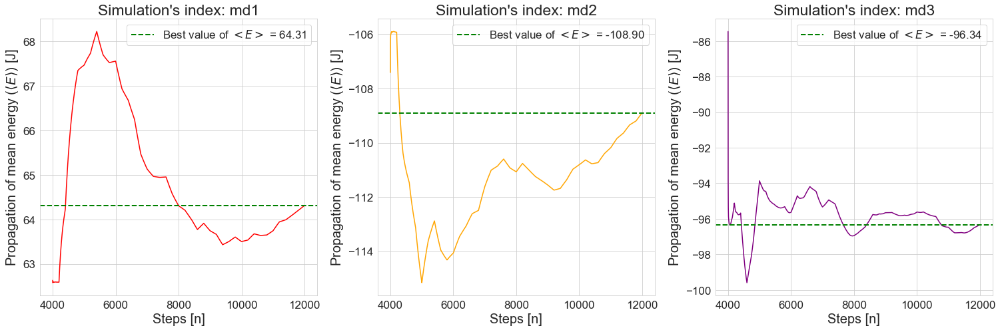

In [136]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('Propagation of mean energy ($\\left< E \\right>$) [J]', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

axes[0].plot([i for i in range(equlibrium, len(E_expected_propag_1)+equlibrium)], E_expected_propag_1, color='red')
axes[1].plot([i for i in range(equlibrium, len(E_expected_propag_2)+equlibrium)], E_expected_propag_2, color='orange')
axes[2].plot([i for i in range(equlibrium, len(E_expected_propag_3)+equlibrium)], E_expected_propag_3, color='purple')

axes[0].axhline(y=E_expected_propag_1[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $< E >$ = {0:.2f}'.format(E_expected_propag_1[-1]))
axes[1].axhline(y=E_expected_propag_2[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $< E >$ = {0:.2f}'.format(E_expected_propag_2[-1]))
axes[2].axhline(y=E_expected_propag_3[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $< E >$ = {0:.2f}'.format(E_expected_propag_3[-1]))

for i in range(0,ncols):
    axes[i].legend(loc='upper right', fontsize=17)

fig.tight_layout()
plt.savefig(image_path_others +
            'energy_propag_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

In [137]:
E2_expected_propag_1 = np.array([np.mean(np.square(Energy_1[equlibrium:i+1])) for i in range(equlibrium, len(Energy_1))])
E2_expected_propag_2 = np.array([np.mean(np.square(Energy_2[equlibrium:i+1])) for i in range(equlibrium, len(Energy_2))])
E2_expected_propag_3 = np.array([np.mean(np.square(Energy_3[equlibrium:i+1])) for i in range(equlibrium, len(Energy_3))])

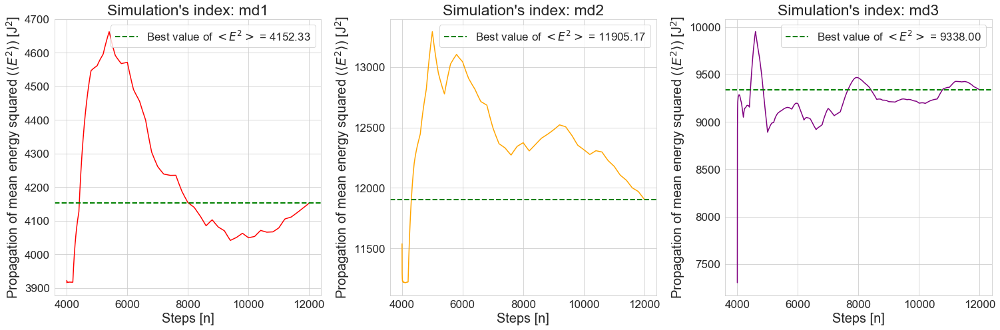

In [138]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('Propagation of mean energy squared ($\\left< E^{2} \\right>$) [J$^{2}$]', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

axes[0].plot([i for i in range(equlibrium, len(Energy_1))], E2_expected_propag_1, color='red')
axes[1].plot([i for i in range(equlibrium, len(Energy_2))], E2_expected_propag_2, color='orange')
axes[2].plot([i for i in range(equlibrium, len(Energy_3))], E2_expected_propag_3, color='purple')

axes[0].axhline(y=E2_expected_propag_1[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $< E^2 >$ = {0:.2f}'.format(E2_expected_propag_1[-1]))
axes[1].axhline(y=E2_expected_propag_2[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $< E^2 >$ = {0:.2f}'.format(E2_expected_propag_2[-1]))
axes[2].axhline(y=E2_expected_propag_3[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $< E^2 >$ = {0:.2f}'.format(E2_expected_propag_3[-1]))

for i in range(0,ncols):
    axes[i].legend(loc='upper right', fontsize=17)

fig.tight_layout()
plt.savefig(image_path_others +
            'energy2_propag_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

In [139]:
E_oscillation_1 = E2_expected_propag_1 - E_expected_propag_1**2
E_oscillation_2 = E2_expected_propag_2 - E_expected_propag_2**2
E_oscillation_3 = E2_expected_propag_3 - E_expected_propag_3**2

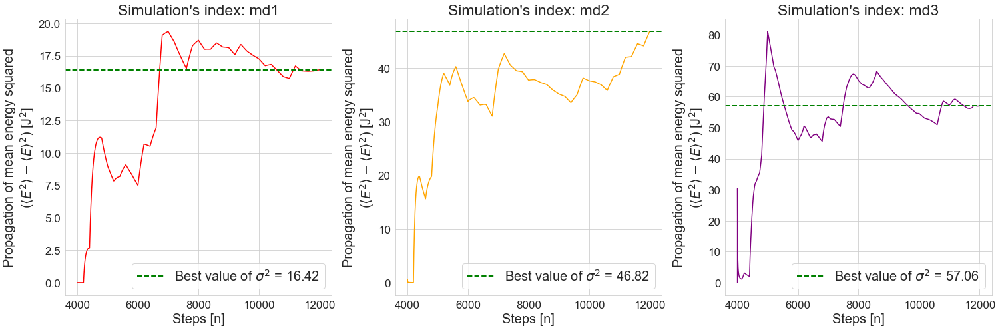

In [140]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('Propagation of mean energy squared\n($\\left< E^{2} \\right> - \\left< E \\right>^{2}$) [J$^{2}$]', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

axes[0].plot([i for i in range(equlibrium, len(Energy_1))], E_oscillation_1, color='red')
axes[1].plot([i for i in range(equlibrium, len(Energy_2))], E_oscillation_2, color='orange')
axes[2].plot([i for i in range(equlibrium, len(Energy_3))], E_oscillation_3, color='purple')

axes[0].axhline(y=E_oscillation_1[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $\sigma^2$ = {0:.2f}'.format(E_oscillation_1[-1]))
axes[1].axhline(y=E_oscillation_2[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $\sigma^2$ = {0:.2f}'.format(E_oscillation_2[-1]))
axes[2].axhline(y=E_oscillation_3[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of $\sigma^2$ = {0:.2f}'.format(E_oscillation_3[-1]))

for i in range(0,ncols):
    axes[i].legend(loc='lower right', fontsize=20)

fig.tight_layout()
plt.savefig(image_path_others +
            'energy_oscill_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

## Heat capacity

Dimension:

$$
[C_{V}]
=
\left[ \frac{1}{k_{B} T^{2}} \cdot \left( \left< E^{2} \right> - \left< E \right>^{2} \right) \right]
=
\frac{1}{\frac{J}{K} \cdot K^{2}} \cdot J^{2}
=
\frac{J}{K}
$$

For argon gas it's

$$
12.76\ \frac{J}{mol \cdot K}
$$

In [141]:
molar_heat_cap_1 = E_oscillation_1 * (1/(k_B * Temperature_1[equlibrium::] * Temperature_1[equlibrium::])) / N_A
molar_heat_cap_2 = E_oscillation_2 * (1/(k_B * Temperature_2[equlibrium::] * Temperature_2[equlibrium::])) / N_A
molar_heat_cap_3 = E_oscillation_3 * (1/(k_B * Temperature_3[equlibrium::] * Temperature_3[equlibrium::])) / N_A

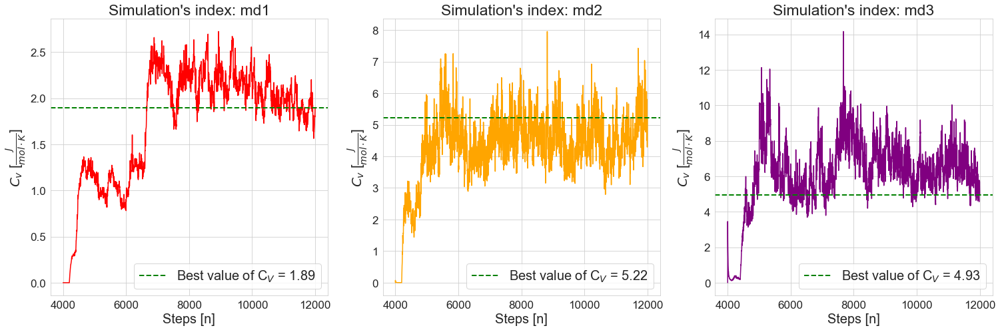

In [142]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('$C_{v}$ [$\\frac{J}{mol \cdot K}$]', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

axes[0].plot([i for i in range(equlibrium, len(Energy_1))],
             molar_heat_cap_1, color='red')
axes[1].plot([i for i in range(equlibrium, len(Energy_2))],
             molar_heat_cap_2, color='orange')
axes[2].plot([i for i in range(equlibrium, len(Energy_3))],
             molar_heat_cap_3, color='purple')

axes[0].axhline(y=molar_heat_cap_1[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of C$_V$ = {0:.2f}'.format(molar_heat_cap_1[-1]))
axes[1].axhline(y=molar_heat_cap_2[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of C$_V$ = {0:.2f}'.format(molar_heat_cap_2[-1]))
axes[2].axhline(y=molar_heat_cap_3[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of C$_V$ = {0:.2f}'.format(molar_heat_cap_3[-1]))

for i in range(0,ncols):
    axes[i].legend(loc='lower right', fontsize=20)

fig.tight_layout()
plt.savefig(image_path_others +
            'heat_capacity_propag_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

## Pressure

In [143]:
PV_exp_1 = np.array([np.mean(Virial_1[equlibrium:i+1]) for i in range(equlibrium, len(Virial_1))])
PV_exp_2 = np.array([np.mean(Virial_2[equlibrium:i+1]) for i in range(equlibrium, len(Virial_2))])
PV_exp_3 = np.array([np.mean(Virial_3[equlibrium:i+1]) for i in range(equlibrium, len(Virial_3))])

PV_1 = N * k_B * Temperature_1[equlibrium:] + 1/3 * PV_exp_1
PV_2 = N * k_B * Temperature_2[equlibrium:] + 1/3 * PV_exp_2
PV_3 = N * k_B * Temperature_3[equlibrium:] + 1/3 * PV_exp_3

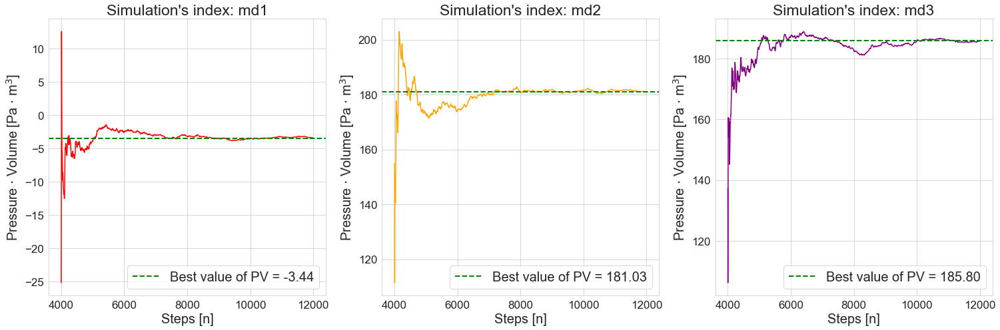

In [144]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('Pressure $\cdot$ Volume [Pa $\cdot$ m$^3$]', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

axes[0].plot([i for i in range(equlibrium, len(Energy_1))],
             PV_1, color='red')
axes[1].plot([i for i in range(equlibrium, len(Energy_2))],
             PV_2, color='orange')
axes[2].plot([i for i in range(equlibrium, len(Energy_3))],
             PV_3, color='purple')

axes[0].axhline(y=PV_1[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of PV = {0:.2f}'.format(PV_1[-1]))
axes[1].axhline(y=PV_2[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of PV = {0:.2f}'.format(PV_2[-1]))
axes[2].axhline(y=PV_3[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of PV = {0:.2f}'.format(PV_3[-1]))

for i in range(0,ncols):
    axes[i].legend(loc='lower right', fontsize=20)

fig.tight_layout()
plt.savefig(image_path_others +
            'PV_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

## Compressibility factor

Dimension:

$$
[Z]
=
\left[ \frac{PV}{N k_{B} T} \right]
=
\frac{\frac{\text{kg}}{\text{m}\ \text{s}^{2}} \text{m}^{3}}{1 \frac{\text{J}}{\text{K}} \text{K}}
=
\frac{\frac{\text{kg}}{\text{m}\ \text{s}^{2}} \text{m}^{3}}{\frac{\text{kg}\ \text{m}^{2}}{\text{s}^{2}}}
=
\frac{\text{m}^{2}}{\text{m}^{2}}
=
1
$$

In [145]:
Z_1 = PV_1 / (N * k_B * Temperature_1[equlibrium:] * N_A)
Z_2 = PV_2 / (N * k_B * Temperature_2[equlibrium:] * N_A)
Z_3 = PV_3 / (N * k_B * Temperature_3[equlibrium:] * N_A)

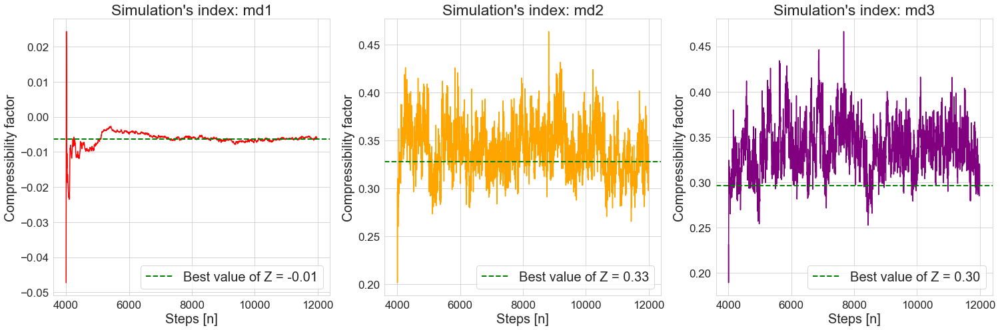

In [146]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('Compressibility factor', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

axes[0].plot([i for i in range(equlibrium, len(Energy_1))],
             Z_1, color='red')
axes[1].plot([i for i in range(equlibrium, len(Energy_1))],
             Z_2, color='orange')
axes[2].plot([i for i in range(equlibrium, len(Energy_1))],
             Z_3, color='purple')

axes[0].axhline(y=Z_1[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of Z = {0:.2f}'.format(Z_1[-1]))
axes[1].axhline(y=Z_2[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of Z = {0:.2f}'.format(Z_2[-1]))
axes[2].axhline(y=Z_3[-1],
                linewidth=2, linestyle='--',  color='green', label='Best value of Z = {0:.2f}'.format(Z_3[-1]))

for i in range(0,ncols):
    axes[i].legend(loc='lower right', fontsize=20)

fig.tight_layout()
plt.savefig(image_path_others +
            'Z_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

## Don't run

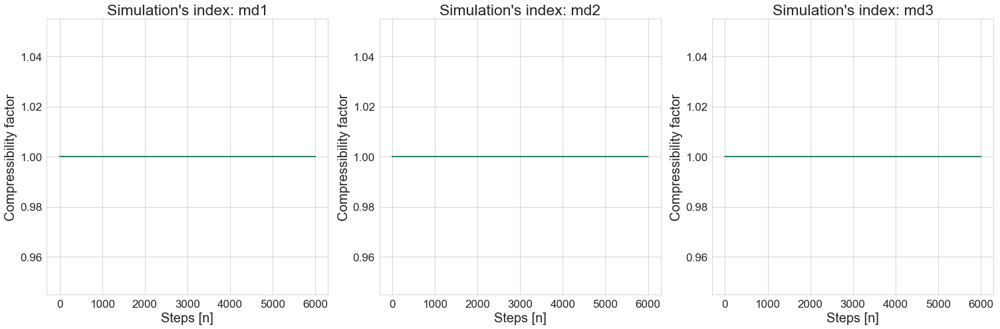

In [240]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7,nrows*7))

titlesize = 23
axislabelsize = 20

for i in range(0,ncols):
    axes[i].set_title('Simulation\'s index: md' + str(i+1), fontsize=titlesize)
    axes[i].set_xlabel('Steps [n]', fontsize=axislabelsize)
    axes[i].set_ylabel('Compressibility factor', fontsize=axislabelsize)
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize-3)
    axes[i].yaxis.get_offset_text().set_size(15)

for i in range(0,10):
    color = np.array([random.random(), random.random(), random.random()])
    
    N = i * 8 + 64
    os.system('..\Release\md1.exe' + ' ' + 'bounded' + ' ' + str(n) + ' ' + str(N) + ' ' + str(T))
    data_set_1 = np.genfromtxt('md1.dat')
    
    current_mode = mode_choose2(file='..\Release\md2.exe', mode='bounded', n=n, N=N, rho=0.95, T=1.0)
    os.system(current_mode)
    data_set_2 = np.genfromtxt('md2.dat')
    
    current_mode = mode_choose3(file='..\Release\md3.exe', mode='bounded', n=n, N=N, rho=0.95, T=1.0, rCutOff=2.5, rMax=3.2, updateInterval=10)
    os.system(current_mode)
    data_set_3 = np.genfromtxt('md3.dat')

    axes[0].plot(data_set_1[::steps,-2], color=color)
    axes[1].plot(data_set_2[::steps,-2], color=color)
    axes[2].plot(data_set_3[::steps,-2], color=color)

fig.tight_layout()
plt.savefig(image_path_others +
            'Z_particles_' + str(int(n/1000)) + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

## Plot coordinates, velocities and accelerations

# MD3

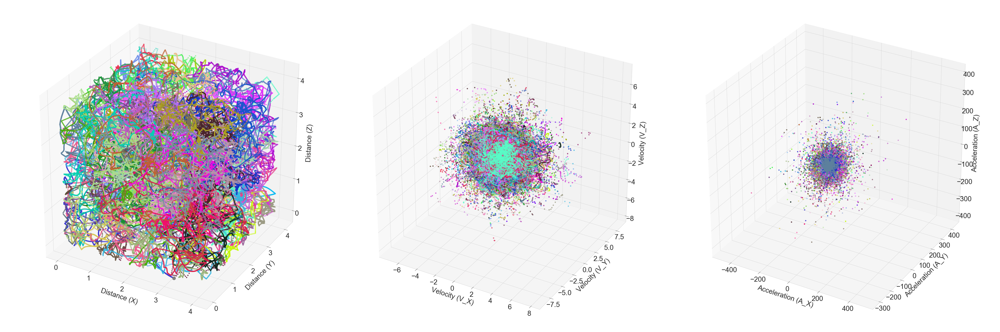

In [53]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*20), subplot_kw={'projection': '3d'})

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('Distance (X)', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_ylabel('Distance (Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_zlabel('Distance (Z)', fontsize=axislabelsize, labelpad=labelpad)

axes[1].set_xlabel('Velocity (V_X)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_ylabel('Velocity (V_Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_zlabel('Velocity (V_Z)', fontsize=axislabelsize, labelpad=labelpad)

axes[2].set_xlabel('Acceleration (A_X)', fontsize=axislabelsize, labelpad=labelpad)
axes[2].set_ylabel('Acceleration (A_Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[2].set_zlabel('Acceleration (A_Z)', fontsize=axislabelsize, labelpad=labelpad)

axes[0].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[1].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[2].tick_params(axis='both', which='major', labelsize=axislabelsize)

for i in range(0, (data_set_3.shape[1]-1)//9):
    color = np.array([random.random(), random.random(), random.random()])
    axes[0].scatter(data_set_3[::steps,i*9], data_set_3[::steps,i*9+1], data_set_3[::steps,i*9+2], color=color)
    axes[1].scatter(data_set_3[::steps,i*9+3], data_set_3[::steps,i*9+4], data_set_3[::steps,i*9+5], color=color)
    axes[2].scatter(data_set_3[::steps,i*9+6], data_set_3[::steps,i*9+7], data_set_3[::steps,i*9+8], color=color)
    
for i in range(0, (data_set_3.shape[1]-1)//9):
    axes[0].scatter(data_set_3[::steps,i*9][-1], data_set_3[::steps,i*9+1][-1], data_set_3[::steps,i*9+2][-1],
                    color='grey', s=200)

fig.tight_layout()
plt.savefig(image_path_trajectories +
            'md3_trajectories' + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.savefig(image_path_trajectories +
            'md3_trajectories' + '.' +
            'png',
            format='png',
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

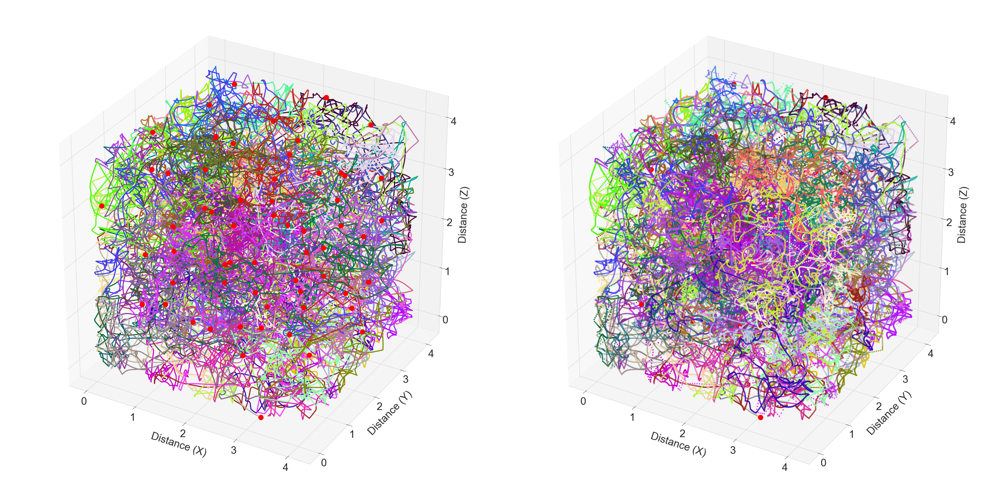

In [54]:
nrows=1
ncols=2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*20), subplot_kw={'projection': '3d'})

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('Distance (X)', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_ylabel('Distance (Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_zlabel('Distance (Z)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_xlabel('Distance (X)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_ylabel('Distance (Y)', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_zlabel('Distance (Z)', fontsize=axislabelsize, labelpad=labelpad)

axes[0].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[1].tick_params(axis='both', which='major', labelsize=axislabelsize)

for i in range(0, (data_set_3.shape[1]-1)//9):
    color = np.array([random.random(), random.random(), random.random()])
    axes[0].plot(data_set_3[::steps,i*9], data_set_3[::steps,i*9+1], data_set_3[::steps,i*9+2], color=color, lw=3)
    axes[0].scatter(data_set_3[::steps,i*9][-1], data_set_3[::steps,i*9+1][-1], data_set_3[::steps,i*9+2][-1],
                 color='red', s=200)
    
    axes[1].scatter(data_set_3[::steps,i*9], data_set_3[::steps,i*9+1], data_set_3[::steps,i*9+2], color=color, s=10)
    axes[1].scatter(data_set_3[::steps,i*9][-1], data_set_3[::steps,i*9+1][-1], data_set_3[::steps,i*9+2][-1],
                 color='red', s=200)

fig.tight_layout()
plt.savefig(image_path_trajectories +
            'md3_trajectories_compare' + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.savefig(image_path_trajectories +
            'md3_trajectories_compare' + '.' +
            'png',
            format='png',
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

C:\Users\Lordpb\AppData\Roaming\Python\Python36\site-packages\scipy\stats\stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


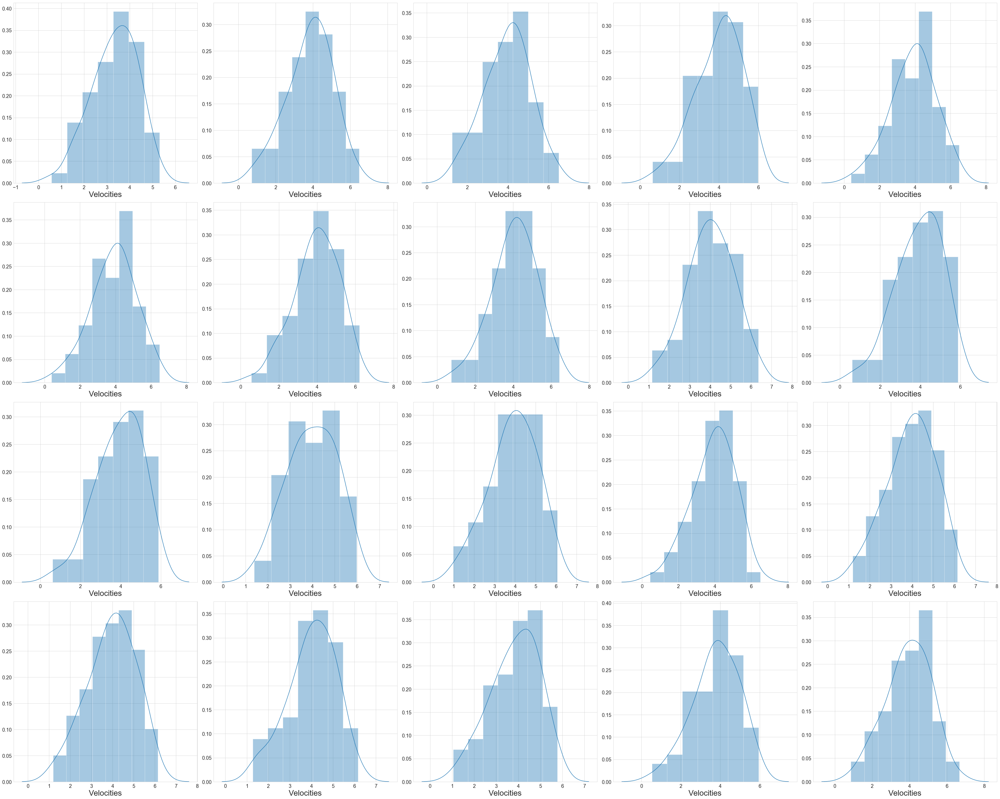

In [55]:
nrows=4
ncols=5
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10,nrows*10))

axislabelsize = 18

for i in range(0,nrows):
    for j in range(0,ncols):
        
        p = int((i*nrows + j) * (len(data_set_3) / (nrows*ncols)))
        velocities = np.array([np.sqrt(data_set_3[::steps][p][k*9]**2 +
                                       data_set_3[::steps][p][k*9+1]**2 +
                                       data_set_3[::steps][p][k*9+2]**2) for k in range(0, (data_set_3.shape[1]-1)//9)])
        sns.distplot(velocities, ax=axes[i][j])
        
        axes[i][j].set_xlabel('Velocities', fontsize=axislabelsize+10)
        axes[i][j].tick_params(axis='both', which='major', labelsize=axislabelsize)
        
fig.tight_layout()
plt.show()

## Differencies with various rCutOffs, rMax and updateIntervals

In [45]:
runtimes = np.genfromtxt('runtimes.dat')

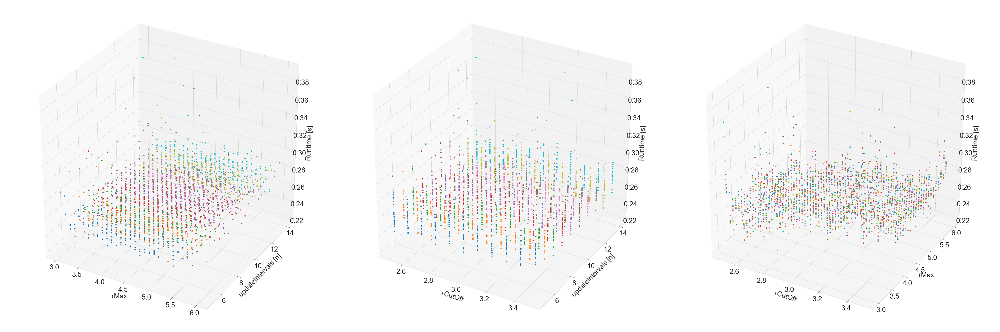

In [46]:
nrows=1
ncols=3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*20), subplot_kw={'projection': '3d'})

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('rMax', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_ylabel('updateIntervals [n]', fontsize=axislabelsize, labelpad=labelpad)
axes[0].set_zlabel('Runtime [s]', fontsize=axislabelsize, labelpad=labelpad)

axes[1].set_xlabel('rCutOff', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_ylabel('updateIntervals [n]', fontsize=axislabelsize, labelpad=labelpad)
axes[1].set_zlabel('Runtime [s]', fontsize=axislabelsize, labelpad=labelpad)

axes[2].set_xlabel('rCutOff', fontsize=axislabelsize, labelpad=labelpad)
axes[2].set_ylabel('rMax', fontsize=axislabelsize, labelpad=labelpad)
axes[2].set_zlabel('Runtime [s]', fontsize=axislabelsize, labelpad=labelpad)

for i in range(0, ncols):
    axes[i].tick_params(axis='both', which='major', labelsize=axislabelsize)

for k in range(1, len(runtimes)):
    
    axes[0].scatter(runtimes[k][1], runtimes[k][2], runtimes[k][3])
    axes[1].scatter(runtimes[k][0], runtimes[k][2], runtimes[k][3])
    axes[2].scatter(runtimes[k][0], runtimes[k][1], runtimes[k][3])
    
fig.tight_layout()
plt.savefig(image_path_others +
            'runtime_full_md3' + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

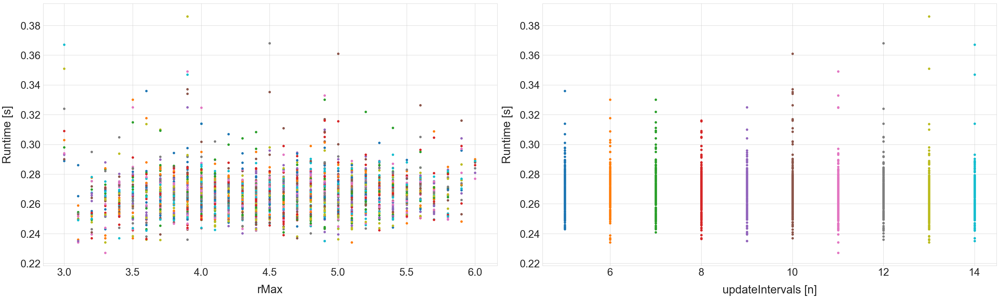

In [59]:
nrows=1
ncols=2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*12))

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('rMax', fontsize=axislabelsize+3, labelpad=labelpad)
axes[0].set_ylabel('Runtime [s]', fontsize=axislabelsize+3, labelpad=labelpad)
axes[1].set_xlabel('updateIntervals [n]', fontsize=axislabelsize+3, labelpad=labelpad)
axes[1].set_ylabel('Runtime [s]', fontsize=axislabelsize+3, labelpad=labelpad)

axes[0].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[1].tick_params(axis='both', which='major', labelsize=axislabelsize)

for k in range(1, len(runtimes)):

    axes[0].scatter(runtimes[k][1], runtimes[k][3])
    axes[1].scatter(runtimes[k][2], runtimes[k][3])
    
fig.tight_layout()
plt.savefig(image_path_others +
            'runtime_rmax_update_md3' + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

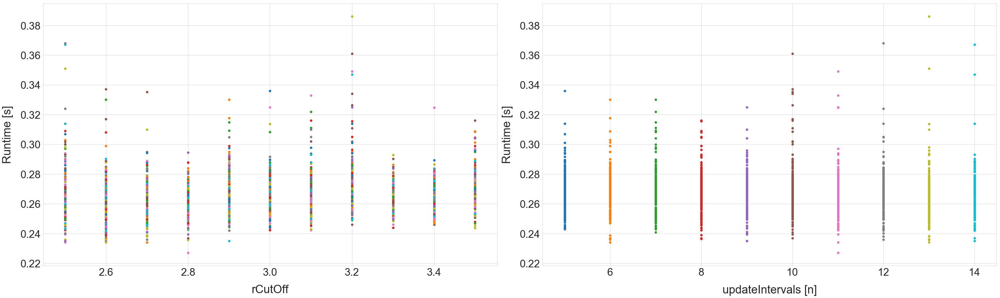

In [60]:
nrows=1
ncols=2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*12))

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('rCutOff', fontsize=axislabelsize+3, labelpad=labelpad)
axes[0].set_ylabel('Runtime [s]', fontsize=axislabelsize+3, labelpad=labelpad)
axes[1].set_xlabel('updateIntervals [n]', fontsize=axislabelsize+3, labelpad=labelpad)
axes[1].set_ylabel('Runtime [s]', fontsize=axislabelsize+3, labelpad=labelpad)

axes[0].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[1].tick_params(axis='both', which='major', labelsize=axislabelsize)

for k in range(1, len(runtimes)):

    axes[0].scatter(runtimes[k][0], runtimes[k][3])
    axes[1].scatter(runtimes[k][2], runtimes[k][3])
    
fig.tight_layout()
plt.savefig(image_path_others +
            'runtime_rcutoff_update_md3' + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()

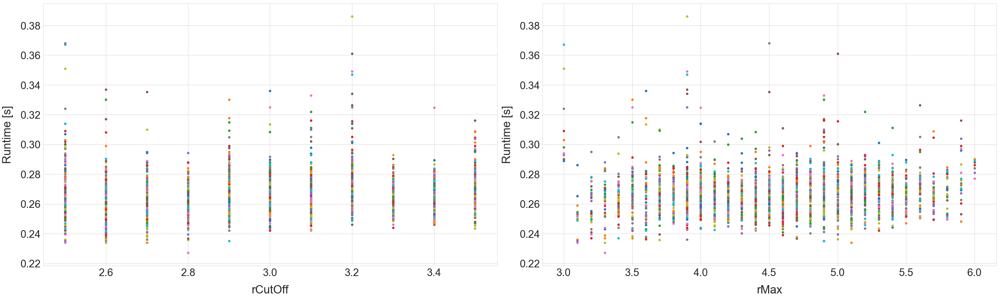

In [61]:
nrows=1
ncols=2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*20,nrows*12))

axislabelsize = 30
labelpad = 20

axes[0].set_xlabel('rCutOff', fontsize=axislabelsize+3, labelpad=labelpad)
axes[0].set_ylabel('Runtime [s]', fontsize=axislabelsize+3, labelpad=labelpad)
axes[1].set_xlabel('rMax', fontsize=axislabelsize+3, labelpad=labelpad)
axes[1].set_ylabel('Runtime [s]', fontsize=axislabelsize+3, labelpad=labelpad)

axes[0].tick_params(axis='both', which='major', labelsize=axislabelsize)
axes[1].tick_params(axis='both', which='major', labelsize=axislabelsize)

for k in range(1, len(runtimes)):

    axes[0].scatter(runtimes[k][0], runtimes[k][3])
    axes[1].scatter(runtimes[k][1], runtimes[k][3])
    
fig.tight_layout()
plt.savefig(image_path_others +
            'runtime_rcutoff_rmax_md3' + '.' +
            image_format,
            format=image_format,
            dpi=image_dpi,
            bbox_inches='tight')
plt.show()